
# Airbnb NYC Analysis


<img src=https://media.giphy.com/media/VYd1jDFLRDM9q/source.gif>

In modern times, traveling is more convenient than before. Transportation and accommodation are not big issues, thanks to advanced searching tools. Travellers need a place to sleep, so they use some mobile applications such as Airbnb, Hostel.com, Booking.com etc. It is safe and easy to find a place for travelers. Those applications use data science to improve their service and search. In this project, Airbnb data will be analysed with machine learning algorithms.

![alt text](https://images.unsplash.com/photo-1534430480872-3498386e7856?ixlib=rb-1.2.1&w=1000&q=80)

Airbnb provides a platform for hosts to accommodate guests with short-term lodging and tourism-related activities. Guests can search for lodging using filters such as lodging type, dates, location, and price. Guests have the ability to search for specific types of homes, such as bed and breakfasts, unique homes, and vacation homes. Before booking, users must provide personal and payment information. Hosts provide prices and other details for their rental or event listings, such as the allowed number of guests, home type, rules, and amenities. Pricing is determined by the host, with recommendations from Airbnb. Hosts and guests have the ability to leave reviews about the experience. Airbnb acts as a broker, receiving commissions from each booking.

The project aims to analyse which factors are significantly important for the price. There are 16 columns that can have an effect on price.

This notebook follows CRISP-DM (Cross-Industry Standard Process for Data Mining) methodology. The steps wil be as below:

1)Business understanding

2)Data understanding

3)Data preparation

4)Modeling

5)Evaluation

6)Deployment

# Step 1: Data Acquisition


## Importing Packages

In this step, Python libraries (such as panda, numpy, sklearn) that will used throughtout the project had been imported.



In [0]:
import pandas as pd
import numpy as np
from os.path import join
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error
import seaborn as sns
import folium
from folium.plugins import FastMarkerCluster
from mpl_toolkits import mplot3d
import plotly.express as px
!pip install geopandas
!pip install graphviz
!pip install pydotplus
import geopandas



%matplotlib inline

In [0]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


## Loading Data
The data from kaggle.com had mounted and dataframes had been created.

In [0]:
filename = "AB_NYC_2019.csv"
path = '/content/drive/My Drive/Cs210/Project Codes/Dataset/'
df = pd.read_csv(join(path, filename))
df_subway = pd.read_csv("/content/drive/My Drive/Cs210/Project Codes/Dataset/NYC_Transit_Subway_Entrance_And_Exit_Data.csv")
df_subway.head()

,Division,Line,Station Name,Station Latitude,Station Longitude,Route1,Route2,Route3,Route4,Route5,Route6,Route7,Route8,Route9,Route10,Route11,Entrance Type,Entry,Exit Only,Vending,Staffing,Staff Hours,ADA,ADA Notes,Free Crossover,North South Street,East West Street,Corner,Entrance Latitude,Entrance Longitude,Station Location,Entrance Location
0,BMT,4 Avenue,25th St,40.660397,-73.998091,R,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Stair,YES,NaN,YES,NONE,NaN,False,NaN,False,4th Ave,25th St,SW,40.660489,-73.998220,"(40.660397, -73.998091)","(40.660489, -73.99822)"
1,BMT,4 Avenue,25th St,40.660397,-73.998091,R,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Stair,YES,NaN,YES,FULL,NaN,False,NaN,False,4th Ave,25th St,SE,40.660323,-73.997952,"(40.660397, -73.998091)","(40.660323, -73.997952)"
2,BMT,4 Avenue,36th St,40.655144,-74.003549,N,R,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Stair,YES,NaN,YES,FULL,NaN,False,NaN,True,4th Ave,36th St,NW,40.654676,-74.004306,"(40.655144, -74.003549)","(40.654676, -74.004306)"
3,BMT,4 Avenue,36th St,40.655144,-74.003549,N,R,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Stair,YES,NaN,YES,FULL,NaN,False,NaN,True,4th Ave,36th St,NE,40.654365,-74.004113,"(40.655144, -74.003549)","(40.654365, -74.004113)"
4,BMT,4 Avenue,36th St,40.655144,-74.003549,N,R,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Stair,YES,NaN,YES,FULL,NaN,False,NaN,True,4th Ave,36th St,NW,40.654490,-74.004499,"(40.655144, -74.003549)","(40.65449, -74.004499)"


In [0]:
df.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


# Step 2: Data Understanding

* Column Names with their corresponding information(dtype,length,etc.)
* Frame Shape
* Statistical Description of Data Frame
* Simple Plots
* Unique Values to our Data Set

Data understanfing plays an important role in order to prepare the data for further actions.It must be done with an extreme care in order allow further steps to work with a better accuracy.Any major error or misleading data can cause a very chaotic effect.

##Basic information about the Data Frame
This category contains:

* Column Names with their corresponding information(dtype,length,etc)
* Frame Shape

Below code gives us the information about both the column names and their corresponding dtype which plays an important role.Each column must be examined due to the fact that there might be some columns with wrong data format.

In [0]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 16 columns):
id                                48895 non-null int64
name                              48879 non-null object
host_id                           48895 non-null int64
host_name                         48874 non-null object
neighbourhood_group               48895 non-null object
neighbourhood                     48895 non-null object
latitude                          48895 non-null float64
longitude                         48895 non-null float64
room_type                         48895 non-null object
price                             48895 non-null int64
minimum_nights                    48895 non-null int64
number_of_reviews                 48895 non-null int64
last_review                       38843 non-null object
reviews_per_month                 38843 non-null float64
calculated_host_listings_count    48895 non-null int64
availability_365                  48895 non-null int64

In [0]:
print("Frame Shape:{}".format(df.shape))

Frame Shape:(48895, 16)


## Summary Statistics


In [0]:
df.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,4.889500e+04,4.889500e+04,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,38843.000000,48895.000000,48895.000000
mean,1.901714e+07,6.762001e+07,40.728949,-73.952170,152.720687,7.029962,23.274466,1.373221,7.143982,112.781327
std,1.098311e+07,7.861097e+07,0.054530,0.046157,240.154170,20.510550,44.550582,1.680442,32.952519,131.622289
min,2.539000e+03,2.438000e+03,40.499790,-74.244420,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000
25%,9.471945e+06,7.822033e+06,40.690100,-73.983070,69.000000,1.000000,1.000000,0.190000,1.000000,0.000000
50%,1.967728e+07,3.079382e+07,40.723070,-73.955680,106.000000,3.000000,5.000000,0.720000,1.000000,45.000000
75%,2.915218e+07,1.074344e+08,40.763115,-73.936275,175.000000,5.000000,24.000000,2.020000,2.000000,227.000000
max,3.648724e+07,2.743213e+08,40.913060,-73.712990,10000.000000,1250.000000,629.000000,58.500000,327.000000,365.000000


##Simple Plots

From the below figure it can be examined that "*latitude*" and "*longitude*" gives a map of NYC.This means the data set is available in use of Geo-Spatial Visualization which would be conducted in future steps.

/usr/local/lib/python3.6/dist-packages/statsmodels/nonparametric/kde.py:447: RuntimeWarning:

invalid value encountered in greater

/usr/local/lib/python3.6/dist-packages/statsmodels/nonparametric/kde.py:447: RuntimeWarning:

invalid value encountered in less



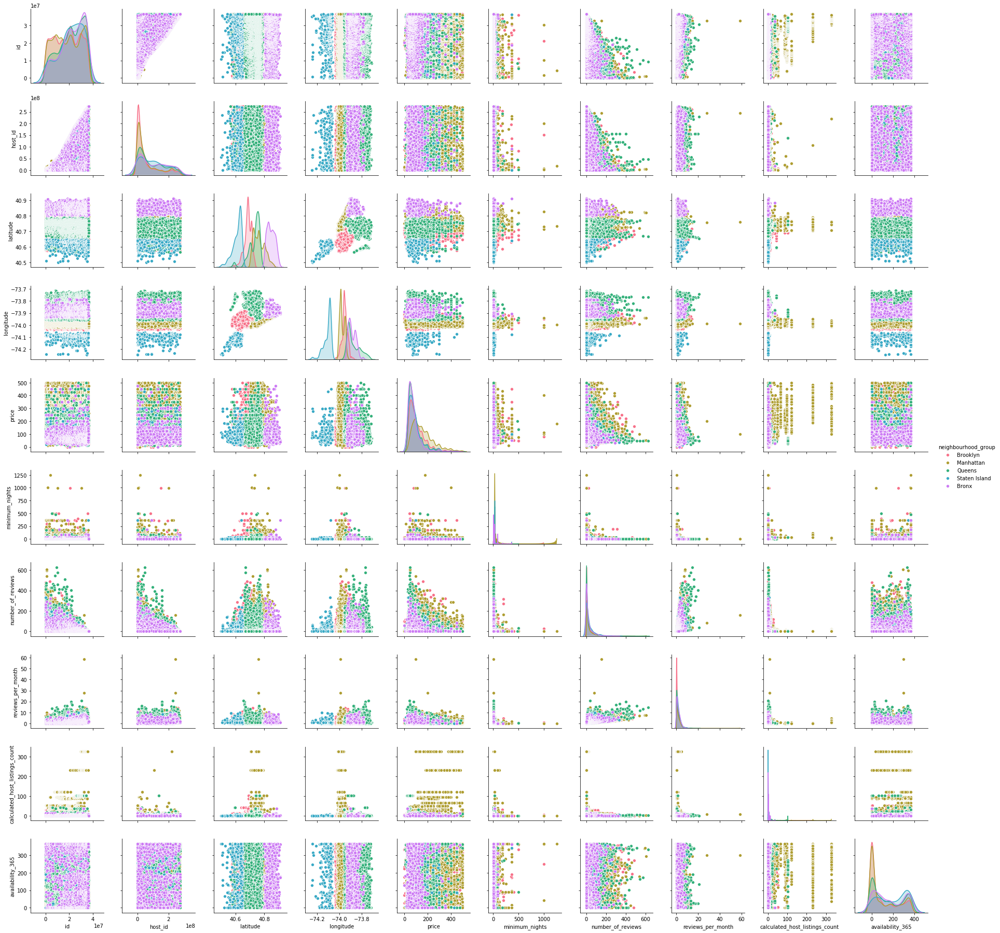

In [0]:
sns.pairplot(df[df.dropna(1).price<500],hue="neighbourhood_group",palette="husl")

When we sort the table in reverse order taking price as the sorting parameter,there occurs to be some outliers existing in the data which must be examined in further steps.

In [0]:
df.sort_values(by="price",ascending=False)

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
9151,7003697,Furnished room in Astoria apartment,20582832,Kathrine,Queens,Astoria,40.76810,-73.91651,Private room,10000,100,2,2016-02-13,0.04,1,0
17692,13894339,Luxury 1 bedroom apt. -stunning Manhattan views,5143901,Erin,Brooklyn,Greenpoint,40.73260,-73.95739,Entire home/apt,10000,5,5,2017-07-27,0.16,1,0
29238,22436899,1-BR Lincoln Center,72390391,Jelena,Manhattan,Upper West Side,40.77213,-73.98665,Entire home/apt,10000,30,0,NaN,NaN,1,83
40433,31340283,2br - The Heart of NYC: Manhattans Lower East ...,4382127,Matt,Manhattan,Lower East Side,40.71980,-73.98566,Entire home/apt,9999,30,0,NaN,NaN,1,365
12342,9528920,"Quiet, Clean, Lit @ LES & Chinatown",3906464,Amy,Manhattan,Lower East Side,40.71355,-73.98507,Private room,9999,99,6,2016-01-01,0.14,1,83
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25778,20624541,Modern apartment in the heart of Williamsburg,10132166,Aymeric,Brooklyn,Williamsburg,40.70838,-73.94645,Entire home/apt,0,5,3,2018-01-02,0.15,1,73
25796,20639914,Cozy yet spacious private brownstone bedroom,86327101,Adeyemi,Brooklyn,Bedford-Stuyvesant,40.68258,-73.91284,Private room,0,1,95,2019-06-23,4.35,6,222
25433,20333471,★Hostel Style Room | Ideal Traveling Buddies★,131697576,Anisha,Bronx,East Morrisania,40.83296,-73.88668,Private room,0,2,55,2019-06-24,2.56,4,127
26841,21291569,Coliving in Brooklyn! Modern design / Shared room,101970559,Sergii,Brooklyn,Bushwick,40.69211,-73.90670,Shared room,0,30,2,2019-06-22,0.11,6,333


## Unique Values Corresponding to our Data Set

In [0]:
for e in df[["neighbourhood","neighbourhood_group","room_type","minimum_nights","number_of_reviews","availability_365"]].columns:
    print("Number of unique values of column ",e," = ",len(df[e].unique()),"\n\nValues : ",df[e].unique(),"\n\n")

Number of unique values of column  neighbourhood  =  221 

Values :  ['Kensington' 'Midtown' 'Harlem' 'Clinton Hill' 'East Harlem'
 'Murray Hill' 'Bedford-Stuyvesant' "Hell's Kitchen" 'Upper West Side'
 'Chinatown' 'South Slope' 'West Village' 'Williamsburg' 'Fort Greene'
 'Chelsea' 'Crown Heights' 'Park Slope' 'Windsor Terrace' 'Inwood'
 'East Village' 'Greenpoint' 'Bushwick' 'Flatbush' 'Lower East Side'
 'Prospect-Lefferts Gardens' 'Long Island City' 'Kips Bay' 'SoHo'
 'Upper East Side' 'Prospect Heights' 'Washington Heights' 'Woodside'
 'Brooklyn Heights' 'Carroll Gardens' 'Gowanus' 'Flatlands' 'Cobble Hill'
 'Flushing' 'Boerum Hill' 'Sunnyside' 'DUMBO' 'St. George' 'Highbridge'
 'Financial District' 'Ridgewood' 'Morningside Heights' 'Jamaica'
 'Middle Village' 'NoHo' 'Ditmars Steinway' 'Flatiron District'
 'Roosevelt Island' 'Greenwich Village' 'Little Italy' 'East Flatbush'
 'Tompkinsville' 'Astoria' 'Clason Point' 'Eastchester' 'Kingsbridge'
 'Two Bridges' 'Queens Village' 'Rocka

# Step 3: Data Preparation

In this step of this notebook,the main focus is on cleaning the data and store the cleaned version.The methods followed for the cleaning the data is stated as below: 
* Drop columns that are not relevant to the problem. Example: id, host_name etc.
* Detect missing values for each column.
* Drop columns if they contain a large proportion of missing values.

It is necessary to first identify the NaN values of the corresponding column.

In [0]:
df.isnull().sum()

id                                    0
name                                 16
host_id                               0
host_name                            21
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10052
reviews_per_month                 10052
calculated_host_listings_count        0
availability_365                      0
dtype: int64

## Drop columns


Before starting to manipulate the missing values,unnecessary columns can be dropped in order to gain a better view for what to do for missing values.
* As it can be observed , "id" column shows no importance to us since there exists no correlation between "id" column and other columns.
* It is also can be stated that "host_name" shows no importance for us and more importantly for ethical reasons such as preserving the privacy of the hosts it is better to drop.
* Column "last_review" must be dropped since almost 20% of the data is missing and also shows no correlative effect in the dataset for further operations.
* Finally, "reviews_per_month" must be dropped for the same reasons as "last_review".





In [0]:
df.drop(['id','host_name','last_review',"reviews_per_month"], axis=1, inplace=True)
#data frame examined after the changes
df.head(5)

,name,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,calculated_host_listings_count,availability_365
0,Clean & quiet apt home by the park,2787,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,6,365
1,Skylit Midtown Castle,2845,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2,355
2,THE VILLAGE OF HARLEM....NEW YORK !,4632,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,1,365
3,Cozy Entire Floor of Brownstone,4869,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,1,194
4,Entire Apt: Spacious Studio/Loft by central park,7192,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,1,0


##Missing Value Handling

After dropping columns we have a clear route in order to decide what to do with missing values.

Missing Value Percentage

In [0]:

total = df.isnull().sum().sort_values(ascending = False)[df.isnull().sum().sort_values(ascending = False) != 0]
percent = round(df.isnull().sum().sort_values(ascending = False)/len(df)*100,2)[round(df.isnull().sum().sort_values(ascending = False)/len(df)*100,2) != 0]
pd.concat([total, percent], axis=1, keys=['Total','Percent'])


,Total,Percent
name,16,0.03


There arae still some instances exists on the column "*name*" which needs a handling.Since we are using the "*name*" not as a numeric value for calculation but as a string of identifier,we can fill NaN's with empty strings. 

In [0]:
df.fillna(value="system_self_filled",inplace=True)

Now,a final examination for NaN values.

In [0]:
print("Number of NaN values existing in the data frame:\n{}".format(df.isna().sum()))

Number of NaN values existing in the data frame:
name                              0
host_id                           0
neighbourhood_group               0
neighbourhood                     0
latitude                          0
longitude                         0
room_type                         0
price                             0
minimum_nights                    0
number_of_reviews                 0
calculated_host_listings_count    0
availability_365                  0
dtype: int64


Table is clear from NaN values but the preparation step is not complete.

## Checking for absurd values
The data set had 3 numeric columns written with float64, 7 with int64 , and after dropping the irrelevant columns, there were 2 float64 and 6 int64 columns.It is necessary to check these columns for any absurd instances.Example: minimum_nights column containing a negative value.

In [0]:
#Calculation of the rows which column value is 0 
print("Number of rows where (minimum_nights <= 0) :",df[df["minimum_nights"] <= 0].shape[0])
print("Number of rows where (number_of_reviews <= 0) :",df[df["number_of_reviews"] <= 0].shape[0])
print("Number of rows where (calculated_host_listings_count <= 0) :",df[df["calculated_host_listings_count"] <= 0].shape[0])
print("Number of rows where (availability_365 <= 0) :",df[df["availability_365"] <= 0].shape[0])
print("Number of rows where (price <= 0) : ",df[df["price"] <= 0].shape[0])

Number of rows where (minimum_nights <= 0) : 0
Number of rows where (number_of_reviews <= 0) : 10052
Number of rows where (calculated_host_listings_count <= 0) : 0
Number of rows where (availability_365 <= 0) : 17533
Number of rows where (price <= 0) :  11


As we can see above "*minimum_nights*", "*calculated_host_listings_count*" does not contain any negative values or 0's but we can't say the same about "*number_of_reviews*" ,"*availability_365*" and "*price*" columns.

A more detailed examination can be conducted for columns came up with a value smaller equals to 0 by only removing the equality symbol that existed in the code above.

In [0]:
print("Number of rows where (number_of_reviews < 0) :",df[df["number_of_reviews"] < 0].shape[0])
print("Number of rows where (availability_365 < 0) :",df[df["availability_365"] < 0].shape[0])
print("Number of rows where (price < 0) : ",df[df["price"] < 0].shape[0])

Number of rows where (number_of_reviews < 0) : 0
Number of rows where (availability_365 < 0) : 0
Number of rows where (price < 0) :  0


There are no rows with negative values that affects the accuracy of our dataset but the instances that is equal to 0 must be examined.

It is not a problematic result to have "*number_of_reviews*" that equals to 0 which can be explained as the host has never been visited by an user but the irregularity in "*availability_365*" and "*price*" is a bit concerning.It must be decided whether to leave the rows with these values or manipulate them with other values.

Since there are only 11 rows with "*price*"==0 these instances can be examined easier.

In [0]:
absurdPrice = df[df["price"] <= 0]
absurdPrice.head(11)

,name,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,calculated_host_listings_count,availability_365
23161,"Huge Brooklyn Brownstone Living, Close to it all.",8993084,Brooklyn,Bedford-Stuyvesant,40.69023,-73.95428,Private room,0,4,1,4,28
25433,★Hostel Style Room | Ideal Traveling Buddies★,131697576,Bronx,East Morrisania,40.83296,-73.88668,Private room,0,2,55,4,127
25634,"MARTIAL LOFT 3: REDEMPTION (upstairs, 2nd room)",15787004,Brooklyn,Bushwick,40.69467,-73.92433,Private room,0,2,16,5,0
25753,"Sunny, Quiet Room in Greenpoint",1641537,Brooklyn,Greenpoint,40.72462,-73.94072,Private room,0,2,12,2,0
25778,Modern apartment in the heart of Williamsburg,10132166,Brooklyn,Williamsburg,40.70838,-73.94645,Entire home/apt,0,5,3,1,73
25794,Spacious comfortable master bedroom with nice ...,86327101,Brooklyn,Bedford-Stuyvesant,40.68173,-73.91342,Private room,0,1,93,6,176
25795,Contemporary bedroom in brownstone with nice view,86327101,Brooklyn,Bedford-Stuyvesant,40.68279,-73.91170,Private room,0,1,95,6,232
25796,Cozy yet spacious private brownstone bedroom,86327101,Brooklyn,Bedford-Stuyvesant,40.68258,-73.91284,Private room,0,1,95,6,222
26259,the best you can find,13709292,Manhattan,Murray Hill,40.75091,-73.97597,Entire home/apt,0,3,0,1,0
26841,Coliving in Brooklyn! Modern design / Shared room,101970559,Brooklyn,Bushwick,40.69211,-73.90670,Shared room,0,30,2,6,333


As we can see there are some absurd rows such as row 9 which contains "*price*" == 0 , "*number_of_reviews*" == 0 , "*availability_365*" == 0, "calculated_host_listings_count == 1" and the "*room_type*" == "Entire home/Apt" which sounds unrealistic so we will drop it.For a better approach lets cross check host_id's of the data set which can help us to decide whether to drop these rows or not.

In [0]:
for index, row in absurdPrice.iterrows():
    print("The host_id:{}".format(row["host_id"]))
    print(df[df.host_id==row["host_id"]])

The host_id:8993084
                                                    name  ...  availability_365
18950   XL Sunny, NYC Flat Close to Train, Cafes & Shops  ...                83
18983  Huge Brownstone,Private Garden- Pet chicks & e...  ...                90
21120         NYC Sunny Private Flat In Heart of it All.  ...               139
23161  Huge Brooklyn Brownstone Living, Close to it all.  ...                28

[4 rows x 12 columns]
The host_id:131697576
                                                    name  ...  availability_365
24960  ★ Comfy Couple's Getaway ★ Walk/Transit Score 85+  ...               325
25121  ★ Business Getaway ★ Cozy & Warm | Laptop Frie...  ...               358
25433      ★Hostel Style Room | Ideal Traveling Buddies★  ...               127
25488    ★ Warm NYC Getaway ★ | Walk/Transit Score 85+ |  ...               171

[4 rows x 12 columns]
The host_id:15787004
                                                    name  ...  availability_365
20059    MA

In [0]:
dropper = df[(df.price==0) & (df.neighbourhood_group=="Manhattan")].index
print(dropper)
df.drop(dropper,inplace=True)
df[df.price==0].head(10)

Int64Index([26259], dtype='int64')


,name,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,calculated_host_listings_count,availability_365
23161,"Huge Brooklyn Brownstone Living, Close to it all.",8993084,Brooklyn,Bedford-Stuyvesant,40.69023,-73.95428,Private room,0,4,1,4,28
25433,★Hostel Style Room | Ideal Traveling Buddies★,131697576,Bronx,East Morrisania,40.83296,-73.88668,Private room,0,2,55,4,127
25634,"MARTIAL LOFT 3: REDEMPTION (upstairs, 2nd room)",15787004,Brooklyn,Bushwick,40.69467,-73.92433,Private room,0,2,16,5,0
25753,"Sunny, Quiet Room in Greenpoint",1641537,Brooklyn,Greenpoint,40.72462,-73.94072,Private room,0,2,12,2,0
25778,Modern apartment in the heart of Williamsburg,10132166,Brooklyn,Williamsburg,40.70838,-73.94645,Entire home/apt,0,5,3,1,73
25794,Spacious comfortable master bedroom with nice ...,86327101,Brooklyn,Bedford-Stuyvesant,40.68173,-73.91342,Private room,0,1,93,6,176
25795,Contemporary bedroom in brownstone with nice view,86327101,Brooklyn,Bedford-Stuyvesant,40.68279,-73.91170,Private room,0,1,95,6,232
25796,Cozy yet spacious private brownstone bedroom,86327101,Brooklyn,Bedford-Stuyvesant,40.68258,-73.91284,Private room,0,1,95,6,222
26841,Coliving in Brooklyn! Modern design / Shared room,101970559,Brooklyn,Bushwick,40.69211,-73.90670,Shared room,0,30,2,6,333
26866,Best Coliving space ever! Shared room.,101970559,Brooklyn,Bushwick,40.69166,-73.90928,Shared room,0,30,5,6,139


After this process we can fill the 0's in "*price*" with the mean of their "*neighbourhood_group*" columns values.

In [0]:
absurdPrice = df[df.price==0]
for index, row in absurdPrice.iterrows():
   
    print("The host_id:{}".format(row["host_id"]))
   
    ng = row["neighbourhood_group"]
    n = row["neighbourhood"]

    print(index)
    print(ng + " " +n)
    
    mean_calc = df[df.neighbourhood_group==ng]
    mean_calc = mean_calc[mean_calc.neighbourhood==n]
    mean = mean_calc.price.mean()
    df.loc[index,'price'] = mean
    print(mean)
for index, row in absurdPrice.iterrows():
   
    print(df.iloc[index])
df[df.price==0].head()

The host_id:8993084
23161
Brooklyn Bedford-Stuyvesant
107.67824448034465
The host_id:131697576
25433
Bronx East Morrisania
85.0
The host_id:15787004
25634
Brooklyn Bushwick
84.80040567951319
The host_id:1641537
25753
Brooklyn Greenpoint
144.82242152466367
The host_id:10132166
25778
Brooklyn Williamsburg
143.80280612244897
The host_id:86327101
25794
Brooklyn Bedford-Stuyvesant
107.70723700712988
The host_id:86327101
25795
Brooklyn Bedford-Stuyvesant
107.73623734019588
The host_id:86327101
25796
Brooklyn Bedford-Stuyvesant
107.76524548164448
The host_id:101970559
26841
Brooklyn Bushwick
84.8348074668071
The host_id:101970559
26866
Brooklyn Bushwick
84.86922321020135
name                              Huge Brooklyn Brownstone Living, Close to it all.
host_id                                                                     8993084
neighbourhood_group                                                        Brooklyn
neighbourhood                                                    Bedford-St

,name,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,calculated_host_listings_count,availability_365


We have succesfully changed the rows with "*price*"==0.We are not going to intervene with "reviews_per_month" since it can be stated that a customer might have choosen not to give a review.

"*Availability_365*" also won't be changed due to the fact that Airbnb allows you hosts to set their listings as unavailable and not take it down.(Cases like the host decides to make differences with the room,or decided not to give the room to Airbnb for a while)
Even though it seems unavailable we can assume them as available.

# Step 4: Explanotary Data Analysis
Bu alan bir açıklamaya ihtiyaç duyuyor.

In [0]:
fig = plt.figure(figsize=(14,14))
ax1 = fig.add_subplot(3, 3, 1)
ax2 = fig.add_subplot(3, 3, 2)
ax3 = fig.add_subplot(3, 3, 3)
ax4 = fig.add_subplot(3, 3, 4)
ax5 = fig.add_subplot(3, 3, 5)
ax6 = fig.add_subplot(3, 3, 6)
ax7 = fig.add_subplot(3, 3, 7)
ax8 = fig.add_subplot(3, 3, 8)

ax1.hist(df["price"], bins=30)
ax1.set_ylabel("Frequency")
ax1.set_title("price")

ax2.hist(df["minimum_nights"], bins=30)
ax2.set_ylabel("Frequency")
ax2.set_title("minimum_nights")

ax3.hist((df["last_review"]), bins=30)
ax3.set_ylabel("Frequency")
ax3.set_title("last_review")

ax4.hist(df["calculated_host_listing_count"], bins=31)
ax4.set_ylabel("Frequency")
ax4.set_title("calculated_host_listing_count")

ax5.hist(df["availability_365"], bins=30)
ax5.set_ylabel("Frequency")
ax5.set_title("availability_365")

plt.show()

##Price

Price is one of the most important feature in our dataset.We will try to discover a relation or a meaningfull thesis with evaluating the data given to us with price.Visualization plays an important role in this procedure.


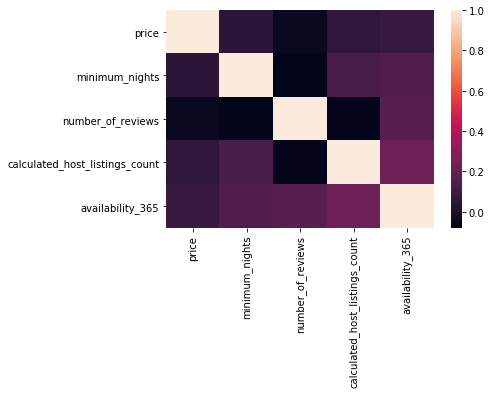

In [0]:
corr = df.drop(columns=['host_id','latitude','longitude']).corr()

sns.heatmap(corr, xticklabels=corr.columns,yticklabels=corr.columns)

The variable price is very weak correlated with the other numerical variables.We need to inspect a deeper.

In [0]:
df['price'].groupby(df["neighbourhood_group"]).describe().round(2)


,count,mean,std,min,25%,50%,75%,max
neighbourhood_group,,,,,,,,
Bronx,1091.0,87.57,106.68,10.0,45.0,65.0,99.0,2500.0
Brooklyn,20104.0,124.43,186.86,10.0,60.0,90.0,150.0,10000.0
Manhattan,21660.0,196.88,291.39,10.0,95.0,150.0,220.0,10000.0
Queens,5666.0,99.52,167.10,10.0,50.0,75.0,110.0,10000.0
Staten Island,373.0,114.81,277.62,13.0,50.0,75.0,110.0,5000.0


Manhattan is the most expensive region, with US$ 196.88 as a mean value.

Bronx is the less expensive region, with US$ 87.50 as a mean value.

In [0]:
df['price'].groupby(df["room_type"]).describe().round(2)

,count,mean,std,min,25%,50%,75%,max
room_type,,,,,,,,
Entire home/apt,25408.0,211.81,284.04,10.0,120.0,160.0,229.0,10000.0
Private room,22326.0,89.81,160.20,10.0,50.0,70.0,95.0,10000.0
Shared room,1160.0,70.27,101.69,10.0,33.0,45.0,75.0,1800.0


Entire home/apt is the most expensive room type with US$ 211.79.

Shared Room is the less expansive room type with US$ 70.13.

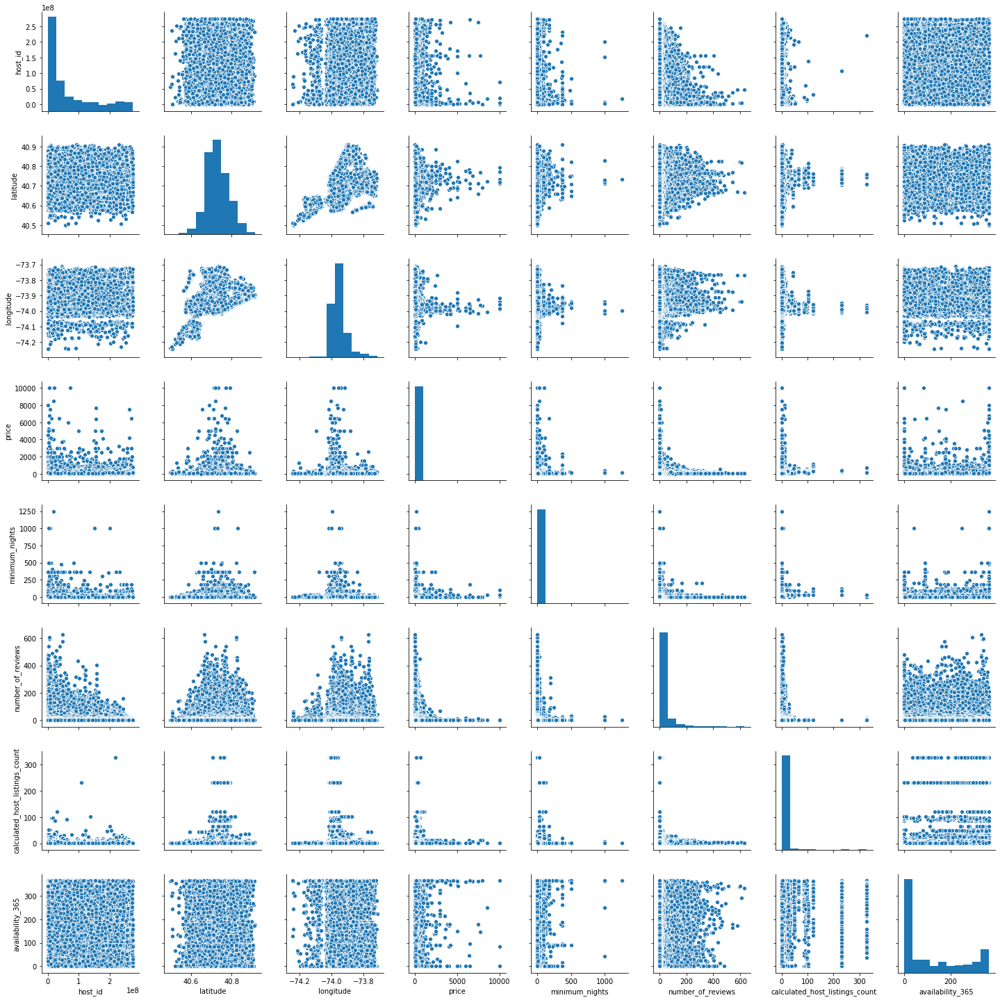

In [0]:
sns.pairplot(df)

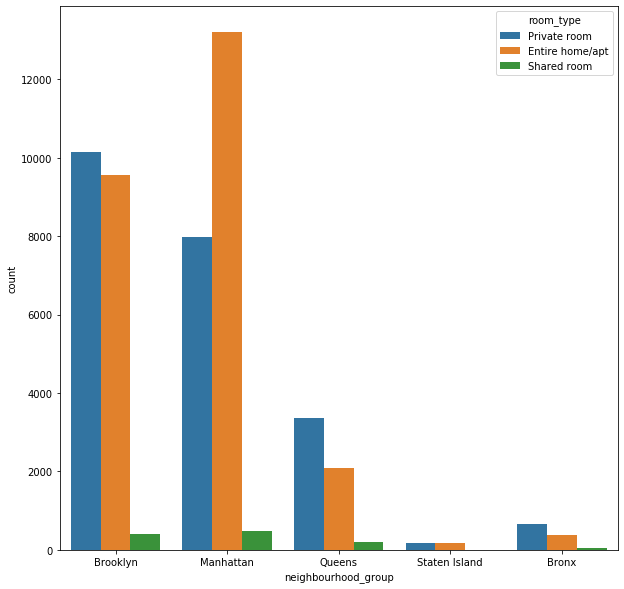

In [0]:
plt.figure(figsize=(10,10))
RoomT_Borough = sns.countplot(df['neighbourhood_group'],hue=df['room_type'])

Plot shows that Entire Home/Apartment are listed most near Manhattan while Private Rooms and Apartments Near Brooklyn are Nearly Equal



##Geo-Spatial Visualization


###Cluster Map of the Hosts

In [0]:
nyc_map = folium.Map(location=[df['latitude'].mean(),df['longitude'].mean()], zoom_start=4)

nyc_map.add_child(FastMarkerCluster(df[['latitude', 'longitude']].values.tolist()))

nyc_map

This map is one of the most important aspect in our project since it allows us to see the locations visually.With a simple look we can see that the largest proportion of the hosts are located in Manhattan.

###Airbnb Room Types in NYC Map
One of the important feature of our data frame is "*room_type*".The map below shows us the distribution of the room types in map of NYC.

/usr/local/lib/python3.6/dist-packages/pyproj/crs.py:77: FutureWarning:

'+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method.



(-74.28337047811617, -73.67222994890714, 40.4751445261289, 40.936503645041604)

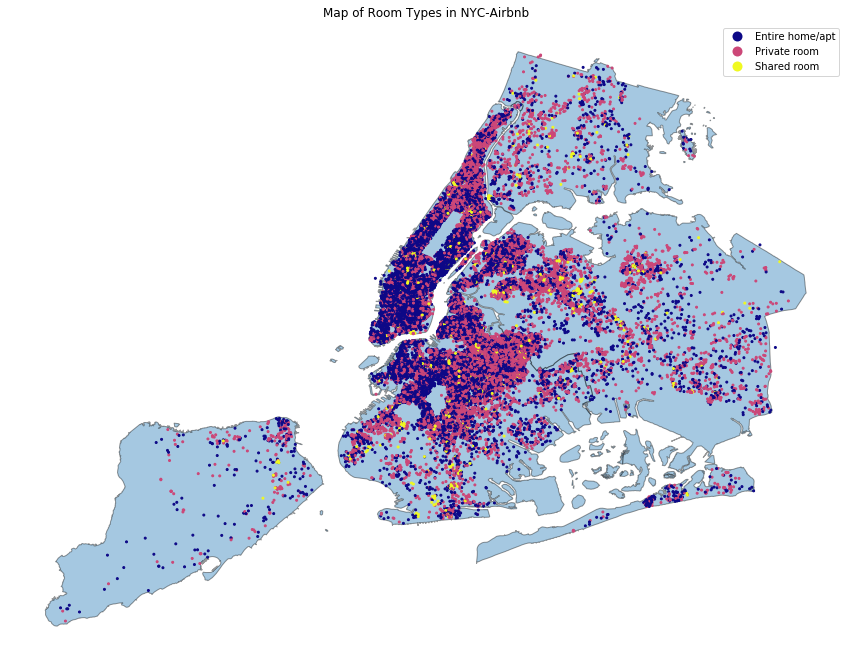

In [0]:
crs = {'init':'epsg:4326'}
geometry = geopandas.points_from_xy(df.longitude, df.latitude)
geo_data = geopandas.GeoDataFrame(df,crs=crs,geometry=geometry)
nyc = geopandas.read_file(geopandas.datasets.get_path('nybb'))
nyc = nyc.to_crs(epsg=4326)
fig,ax = plt.subplots(figsize=(15,15))
nyc.plot(ax=ax,alpha=0.4,edgecolor='black')
geo_data.plot(column='room_type',ax=ax,legend=True,cmap='plasma',markersize=4)

plt.title("Map of Room Types in NYC-Airbnb")
plt.axis('off')

As it can be seen in this map in Manhattan which is counted as the center of the city the number of renting especially the entire apartment is higher. Also in Brooklyn and Bronx the number of renting private rooms can be highlighted. Overall the number of renting is very low in Staten Island. 

### Airbnb Availability Map

(-74.28337047811617, -73.67222994890714, 40.4751445261289, 40.936503645041604)

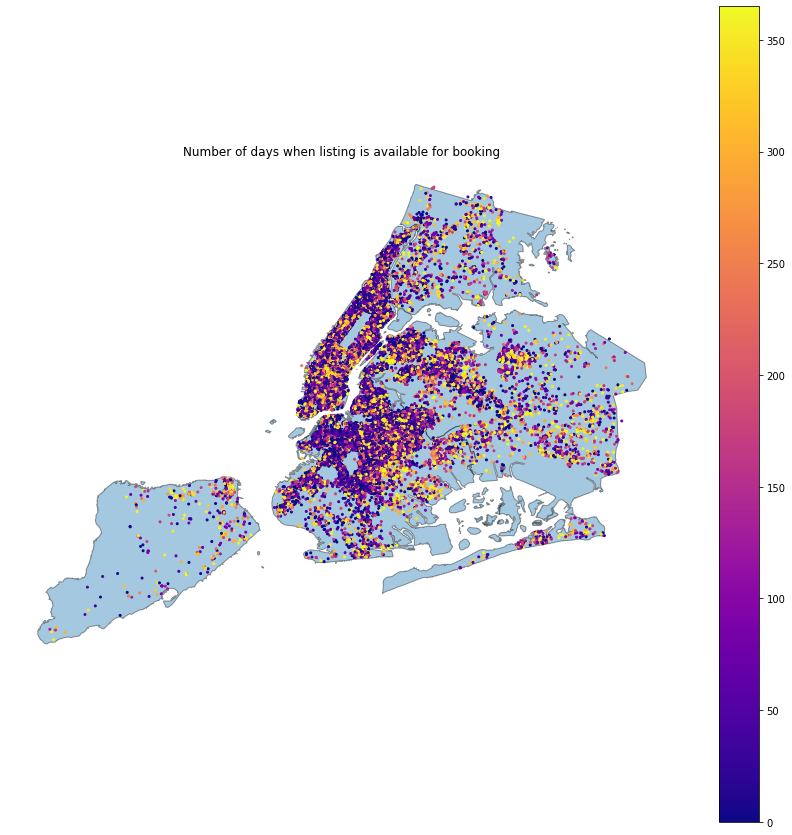

In [0]:
fig,ax = plt.subplots(figsize=(15,15))
nyc.plot(ax=ax,alpha=0.4,edgecolor='black')
geo_data.plot(column='availability_365',ax=ax,legend=True,cmap='plasma',markersize=4)

plt.title("Number of days when listing is available for booking")
plt.axis('off')

In Brooklyn number of days when listing is available for booking is lower than other neighbourhoods which might be due the fact here are more private rooms to rent in that area.

###Airbnb Host Listings Map

(-74.28337047811617, -73.67222994890714, 40.4751445261289, 40.936503645041604)

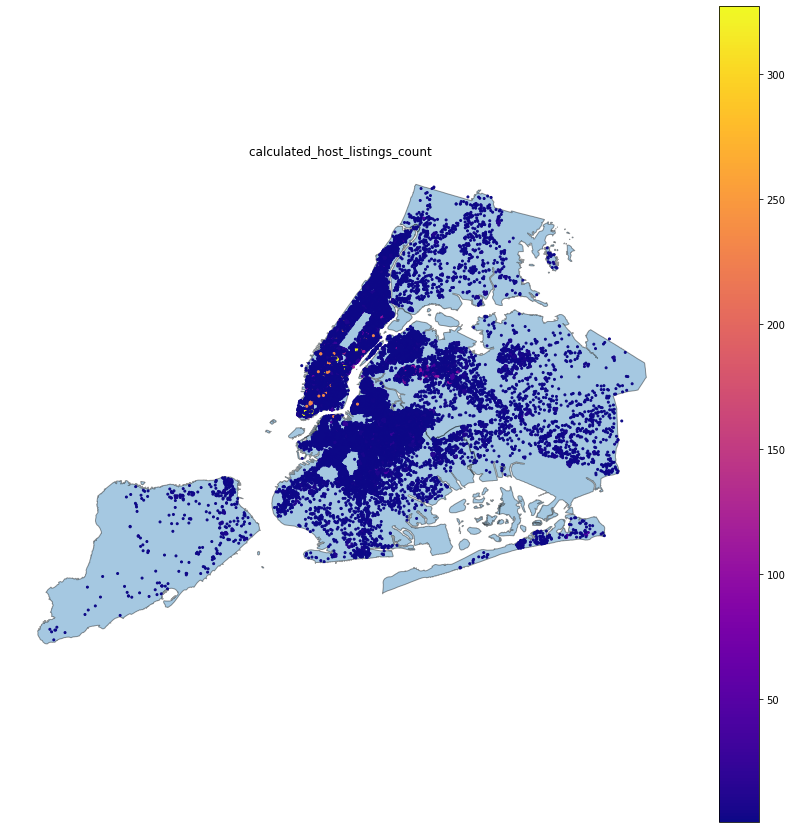

In [0]:
fig,ax = plt.subplots(figsize=(15,15))
nyc.plot(ax=ax,alpha=0.4,edgecolor='black')
geo_data.plot(column='calculated_host_listings_count',ax=ax,legend=True,cmap='plasma',markersize=4)

plt.title("calculated_host_listings_count ")
plt.axis('off')

Bu alan bir açıklamaya ihtiyaç duyuyor.

###NYC-Subway Mapping

What we can go further from here is to map the subway station Entrance and Exit data from https://data.ny.gov/widgets/i9wp-a4ja which is an open  source data.

In [0]:
df_subway.head()

,Division,Line,Station Name,Station Latitude,Station Longitude,Route1,Route2,Route3,Route4,Route5,Route6,Route7,Route8,Route9,Route10,Route11,Entrance Type,Entry,Exit Only,Vending,Staffing,Staff Hours,ADA,ADA Notes,Free Crossover,North South Street,East West Street,Corner,Entrance Latitude,Entrance Longitude,Station Location,Entrance Location
0,BMT,4 Avenue,25th St,40.660397,-73.998091,R,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Stair,YES,NaN,YES,NONE,NaN,False,NaN,False,4th Ave,25th St,SW,40.660489,-73.998220,"(40.660397, -73.998091)","(40.660489, -73.99822)"
1,BMT,4 Avenue,25th St,40.660397,-73.998091,R,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Stair,YES,NaN,YES,FULL,NaN,False,NaN,False,4th Ave,25th St,SE,40.660323,-73.997952,"(40.660397, -73.998091)","(40.660323, -73.997952)"
2,BMT,4 Avenue,36th St,40.655144,-74.003549,N,R,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Stair,YES,NaN,YES,FULL,NaN,False,NaN,True,4th Ave,36th St,NW,40.654676,-74.004306,"(40.655144, -74.003549)","(40.654676, -74.004306)"
3,BMT,4 Avenue,36th St,40.655144,-74.003549,N,R,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Stair,YES,NaN,YES,FULL,NaN,False,NaN,True,4th Ave,36th St,NE,40.654365,-74.004113,"(40.655144, -74.003549)","(40.654365, -74.004113)"
4,BMT,4 Avenue,36th St,40.655144,-74.003549,N,R,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Stair,YES,NaN,YES,FULL,NaN,False,NaN,True,4th Ave,36th St,NW,40.654490,-74.004499,"(40.655144, -74.003549)","(40.65449, -74.004499)"


We are not going to work with the routes etc. so unnecessary columns needs to be dropped.

In [0]:
df_subway.drop(columns=list(df_subway.columns)[5:16],inplace=True)
df_subway.head()

,Division,Line,Station Name,Station Latitude,Station Longitude,Entrance Type,Entry,Exit Only,Vending,Staffing,Staff Hours,ADA,ADA Notes,Free Crossover,North South Street,East West Street,Corner,Entrance Latitude,Entrance Longitude,Station Location,Entrance Location
0,BMT,4 Avenue,25th St,40.660397,-73.998091,Stair,YES,NaN,YES,NONE,NaN,False,NaN,False,4th Ave,25th St,SW,40.660489,-73.998220,"(40.660397, -73.998091)","(40.660489, -73.99822)"
1,BMT,4 Avenue,25th St,40.660397,-73.998091,Stair,YES,NaN,YES,FULL,NaN,False,NaN,False,4th Ave,25th St,SE,40.660323,-73.997952,"(40.660397, -73.998091)","(40.660323, -73.997952)"
2,BMT,4 Avenue,36th St,40.655144,-74.003549,Stair,YES,NaN,YES,FULL,NaN,False,NaN,True,4th Ave,36th St,NW,40.654676,-74.004306,"(40.655144, -74.003549)","(40.654676, -74.004306)"
3,BMT,4 Avenue,36th St,40.655144,-74.003549,Stair,YES,NaN,YES,FULL,NaN,False,NaN,True,4th Ave,36th St,NE,40.654365,-74.004113,"(40.655144, -74.003549)","(40.654365, -74.004113)"
4,BMT,4 Avenue,36th St,40.655144,-74.003549,Stair,YES,NaN,YES,FULL,NaN,False,NaN,True,4th Ave,36th St,NW,40.654490,-74.004499,"(40.655144, -74.003549)","(40.65449, -74.004499)"


Data Understanding,Wrangling and Preperation

In [0]:
df_subway.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1868 entries, 0 to 1867
Data columns (total 21 columns):
Division              1868 non-null object
Line                  1868 non-null object
Station Name          1868 non-null object
Station Latitude      1868 non-null float64
Station Longitude     1868 non-null float64
Entrance Type         1868 non-null object
Entry                 1868 non-null object
Exit Only             56 non-null object
Vending               1868 non-null object
Staffing              1868 non-null object
Staff Hours           40 non-null object
ADA                   1868 non-null bool
ADA Notes             75 non-null object
Free Crossover        1868 non-null bool
North South Street    1839 non-null object
East West Street      1833 non-null object
Corner                1836 non-null object
Entrance Latitude     1868 non-null float64
Entrance Longitude    1868 non-null float64
Station Location      1868 non-null object
Entrance Location     1868 non-null obj

Missing Values Needs Handling

In [0]:
df_subway.isnull().sum()

Division                 0
Line                     0
Station Name             0
Station Latitude         0
Station Longitude        0
Entrance Type            0
Entry                    0
Exit Only             1812
Vending                  0
Staffing                 0
Staff Hours           1828
ADA                      0
ADA Notes             1793
Free Crossover           0
North South Street      29
East West Street        35
Corner                  32
Entrance Latitude        0
Entrance Longitude       0
Station Location         0
Entrance Location        0
dtype: int64

The data shows a shape that satisfies our needs so lets drop more of the unnecessary columns that we have.

In [0]:
df_subway.drop(columns=list(df_subway.columns)[5:17],inplace=True)
df_subway.head()

,Division,Line,Station Name,Station Latitude,Station Longitude,Entrance Latitude,Entrance Longitude,Station Location,Entrance Location
0,BMT,4 Avenue,25th St,40.660397,-73.998091,40.660489,-73.998220,"(40.660397, -73.998091)","(40.660489, -73.99822)"
1,BMT,4 Avenue,25th St,40.660397,-73.998091,40.660323,-73.997952,"(40.660397, -73.998091)","(40.660323, -73.997952)"
2,BMT,4 Avenue,36th St,40.655144,-74.003549,40.654676,-74.004306,"(40.655144, -74.003549)","(40.654676, -74.004306)"
3,BMT,4 Avenue,36th St,40.655144,-74.003549,40.654365,-74.004113,"(40.655144, -74.003549)","(40.654365, -74.004113)"
4,BMT,4 Avenue,36th St,40.655144,-74.003549,40.654490,-74.004499,"(40.655144, -74.003549)","(40.65449, -74.004499)"


Now there is only one problem exists,NYC Subway has 472 stations bt this data contains every entrance as a row which causes 2 main problems,duplicate datas and rendering issue since the data is large so we need to remove duplicates.

In [0]:
df_subway_unique = df_subway.drop_duplicates(['Station Name'], keep='last')
print("Station Number: {}".format(df_subway_unique.shape[0]))

Station Number: 356


We have reduced our dataset so it is time for us to put our markers for the map.

/usr/local/lib/python3.6/dist-packages/pyproj/crs.py:77: FutureWarning:

'+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method.



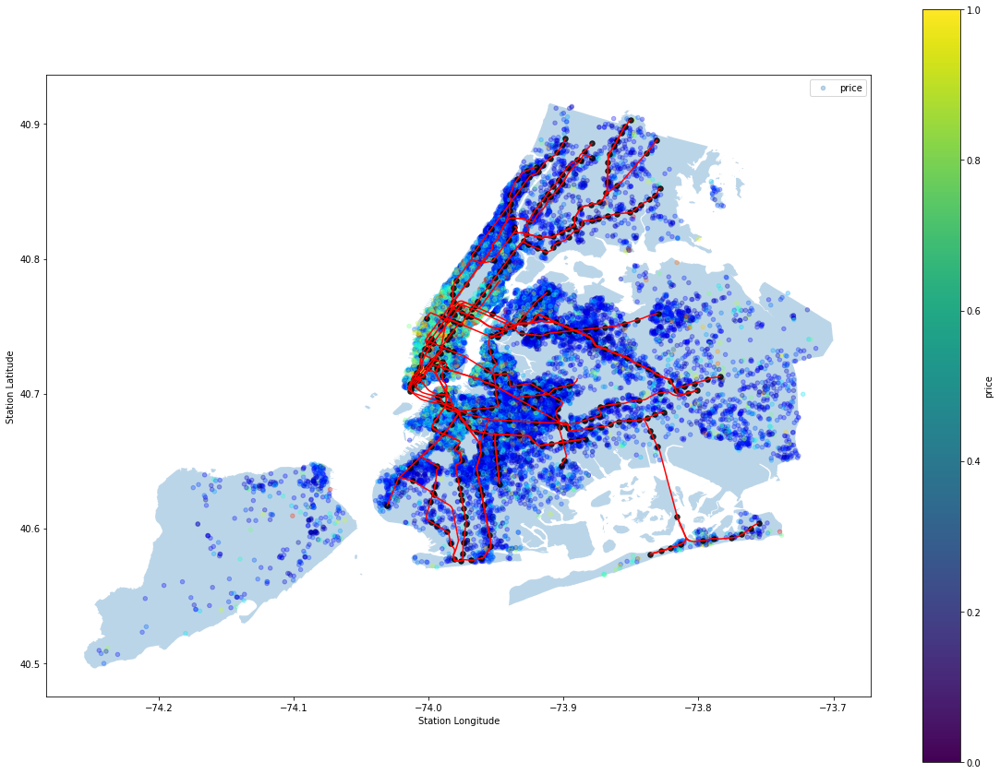

In [0]:

df_sub_gpd = geopandas.read_file('/content/drive/My Drive/Cs210/Subway Lines (1).geojson')

ax_route = df_sub_gpd.plot(color='red')
nyc = geopandas.read_file(geopandas.datasets.get_path('nybb'))
nyc = nyc.to_crs(epsg=4326)
ax_base = nyc.plot(ax=ax_route,alpha=0.3, figsize=(20,15))
sub_6=df[df.price<500]
ax=sub_6.plot(ax=ax_base,kind='scatter', x='longitude', y='latitude', label='price', c='price',cmap=plt.get_cmap('jet'), colorbar=True, alpha=0.3, figsize=(20,15))

sub_7 = df_subway_unique
sub_7.plot(ax=ax,kind='scatter', x='Station Longitude', y='Station Latitude', alpha=0.8, figsize=(20,15),c='black',s=30,colorbar=False)



Finally,we can see that for Manhattan region,being close to subway showed some affect on "*price*".We can also see that Manhattan contains a large amount of the interstations which might cause an affect on price.

# Step 5: Modelling Data 


In this step,what we are basically trying to achieve is to select an efficient multivariate ML algorithm which would predict the price with feature sensitively.Why we are choosing such an algorithm is that there are a lot of different parameters which shows importance while obtaining the price such as location,room type,closeness to any public transport.

Repeats for every model:
* Data set to be splitted properly
* Implementation of model
<br>
<br>
Here is a graph which could help us to gain an idea about what to do.


<img src=https://scikit-learn.org/stable/_static/ml_map.png>

So before starting blindly,lets use our observations in order to answer these two questions below.
* What is our problem?
  * We want to predict prices.
  * We want to perform a data modeling from information we gathered in order be used for predicting or decision making.
  * Our problem is that our dataset does not show any linear correlation between two features where one of them is price.
  * The problem occurs due to the fact that important features in our data that would create a correlation with price can only be used together.
    * We can not use "*latitude*" and "*longitude*" separetly in order to derive a statistical result.
* What possible ML algorithms can give a solution to our problem ? 
  * It is possible to answer this question with a lot of different appropaches.
      * First of all,after examining the decision map above we know that our problem can be solved using regression,not classification.v
      * We can use the regression based ML models for evaluating a better price predicting model.



In [0]:
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC, LinearSVC
from sklearn.neighbors import KNeighborsRegressor
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import SGDClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import train_test_split
from sklearn import metrics

In [0]:
feature_cols = ['latitude','longitude','price']
X = df[feature_cols]
y=df['neighbourhood']
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size=0.3,random_state=45) # 70% training and 30% test

In [0]:
knn = KNeighborsClassifier(n_neighbors=10)
knn.fit(X_train,y_train)
y_pred = knn.predict(X_test)
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

Accuracy: 0.5956097893516941


In [0]:
model = DecisionTreeClassifier()
model.fit(X_train,y_train)
y_pred = model.predict(X_test)
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))



Accuracy: 0.965914513600109


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.142848 to fit

dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.142848 to fit



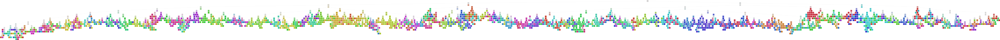

In [0]:
from sklearn.tree import export_graphviz
from sklearn.externals.six import StringIO  
from IPython.display import Image  
import pydotplus


dot_data = StringIO()
export_graphviz(model, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,
                feature_names = feature_cols,
                )
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  
graph.write_png('result.png')
Image(graph.create_png())

# Step 6: Evaluation 

* Out-of-bag performance of each algorithm
* Hypertuning of each algorithm
* Best Score performance of each algorithm
* Conclusion about which algorithm to be selected.

# Final Results

* Which problems occured while analyzing the data and how was it solved ?
* What we obtained from data set buy EDA ?
* What can be done via using Machine Learning Algorithms in the datasest?
* Which Machine Learning Algorithms are better for which cases ? ->Price Prediction vs K-means Clustering

##Natural Language Process

In [0]:
#import necessary libraries
import nltk
import os
import nltk.corpus
from nltk import ne_chunk
from nltk.corpus import stopwords
from nltk import word_tokenize
from nltk.stem import WordNetLemmatizer
import string
nltk.download('stopwords')
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('maxent_ne_chunker')
nltk.download('words')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package maxent_ne_chunker to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package maxent_ne_chunker is already up-to-date!
[nltk_data] Downloading package words to /root/nltk_data...
[nltk_data]   Package words is already up-to-date!


True

In [0]:
#initiate stopwords
a = set(stopwords.words('english'))
#obtain text
text = df["name"].iloc[10]
#tokenize text
text1 = word_tokenize(text.lower())
#create a list free of stopwords
no_stopwords = [x for x in text1 if x not in a]
#lemmatize the words
lemmatizer = WordNetLemmatizer() 
lemmatized = [lemmatizer.lemmatize(x) for x in no_stopwords]

In [0]:
def unique_words1(dwelling):

    apt = df[df["room_type"]==dwelling]["name"]
    a = set(stopwords.words('english'))
    words = []
    # append each to a list
    for lis in range(0, len(apt)):
        listing = apt.reset_index().iloc[lis,1]
        #tokenize text
        text1 = word_tokenize(listing.lower())
        #create a list free of stopwords
        no_stopwords = [x for x in text1 if x not in a]
        #lemmatize the words
        lemmatized = [lemmatizer.lemmatize(x) for x in no_stopwords]
        no_punctuation = [x.translate(str.maketrans('','',string.punctuation)) for x in lemmatized]
        no_digits = [x.translate(str.maketrans('','',"0123456789")) for x in no_punctuation ]
        for item in no_digits:
            words.append(item)


    #create a dictionary
    unique={}
    for word in words:
        if word in unique:
            unique[word] +=1
        else:
            unique[word] = 1

    #sort the dictionary
    a=[]
    b=[]

    for key, value in unique.items():
        a.append(key)
        b.append(value)

    aa=pd.Series(a)
    bb=pd.Series(b)    

    comb=pd.concat([aa,bb],axis=1).sort_values(by=1, ascending=False).copy()

    return comb

#apply the function
private = unique_words1("Private room")
home = unique_words1("Entire home/apt")
shared = unique_words1("Shared room")

words_private = private.iloc[1:,1]
words_home = home.iloc[1:,1] 
words_shared = shared.iloc[1:,1] 

#plot the results
plt.plot(words_shared.reset_index()[1], label="shared")
plt.plot(words_private.reset_index()[1], label ="private")
plt.plot(words_home.reset_index()[1], label="Entire home/apt")
plt.xlim(0,200)
plt.ylabel("WordFrequency")
plt.xlabel("Word position on the list")
plt.legend()
plt.show()

KeyboardInterrupt: ignored

In [0]:
home_new = home.reset_index().iloc[1:50,1:3].copy()
private_new = private.reset_index().iloc[1:50,1:3].copy()
shared_new = shared.reset_index().iloc[1:50,1:3].copy()

all_words = pd.concat([home_new, private_new, shared_new], axis=1, sort=False)
all_words

In [0]:
#see how many listing there are for each type of room:
print("Numer of shared room listings: "+str(len(df[df["room_type"]=="Shared room"])))
print("Numer of private room listings: "+str(len(df[df["room_type"]=="Private room"])))
print("Numer of entire home/apt listings: "+str(len(df[df["room_type"]=="Entire home/apt"])))

In [0]:
#Create a list of the most popular words common for all room types:
most_popular_words = home_new.iloc[:,0].tolist()+private_new.iloc[:,0].tolist()+shared_new.iloc[:,0].tolist()
most_popular = pd.Series(most_popular_words)
popular_descriptors=most_popular.unique().tolist()

In [0]:
def unique_words2(name, word):
    '''This function takes individual name and looks for a matching word in it'''
    a = set(stopwords.words('english'))
    #tokenize the name
    text1 = word_tokenize(str(name).lower())
    #create a list free of stopwords
    no_stopwords = [x for x in text1 if x not in a]
    #lemmatize the words
    lemmatized = [lemmatizer.lemmatize(x) for x in no_stopwords]
    no_punctuation = [x.translate(str.maketrans('','',string.punctuation)) for x in lemmatized]
    no_digits = [x.translate(str.maketrans('','',"0123456789")) for x in no_punctuation ]
    counter = 0
    for item in no_digits:
        if str(item) == str(word):
            counter += 1
        else:
            continue

    if counter != 0:
        return 1
    else:
        return 0
    
#Apply the function 
for item in popular_descriptors:
    df[item]= df["name"].apply(lambda x: unique_words2(x,item))

In [0]:
#convert last review to dummies
df = pd.concat([df, pd.get_dummies(df['neighbourhood_group'], drop_first=False)], axis=1)
df.drop(['neighbourhood_group'],axis=1, inplace=True)

In [0]:
def plot_by_word(word):
    '''creates a plot of price for listings matching given word'''
    y = df[(df[word]==1)].latitude
    x = df[(df[word]==1)].longitude
    p = df[(df[word]==1)].log_price
    plt.figure(figsize=(16,9))
    plt.scatter(x,y,c=p,cmap='viridis')
    plt.xlabel
    plt.colorbar()
    plt.xlabel("Longitude")
    plt.ylabel("Latitude")
    plt.title("Word 'Luxury' in the name of the listing\nColormap indicates price")
    plt.show()
    
plot_by_word("room")
df.head()